# Advanced Lane Finding (Udacity Self Dricing Car Nanodegree)

## Project 4

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [1]:
import os
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mplimg
import imageio 
imageio.plugins.ffmpeg.download()
from moviepy.editor import VideoFileClip
from collections import deque
%matplotlib inline

In [2]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [3]:
# Create 'output_images' folder if it doesn't exist
out_images_folder = 'output_images'
if not os.path.exists(out_images_folder):
    os.makedirs(out_images_folder)

# A. Distortion Correction

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

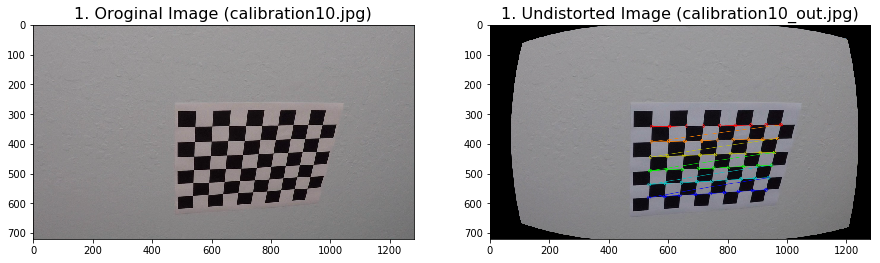

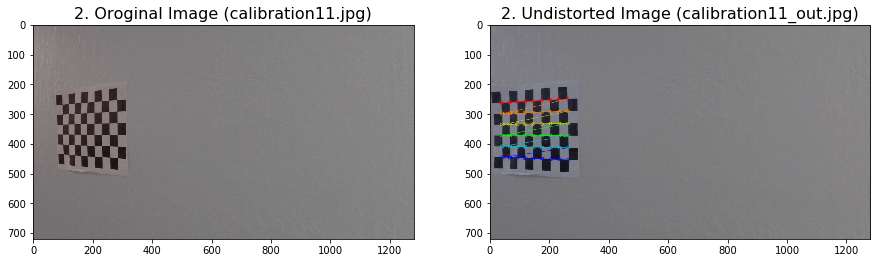

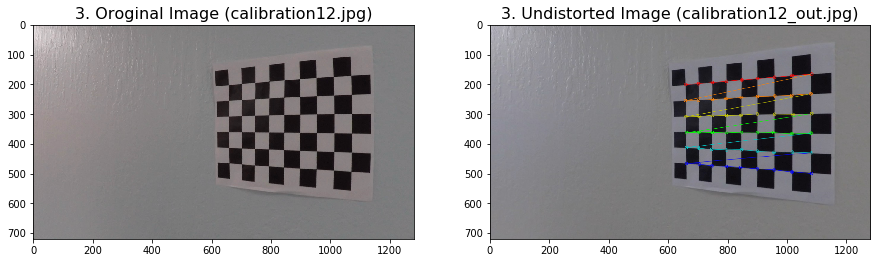

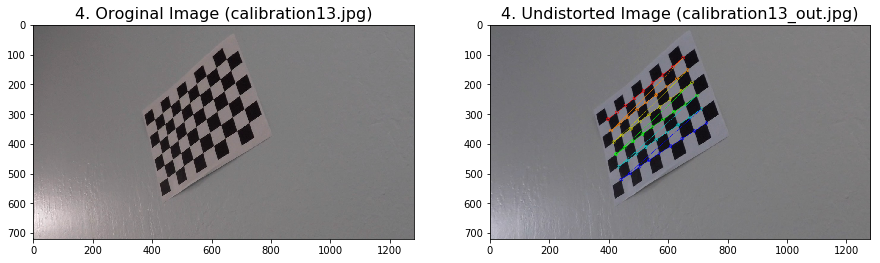

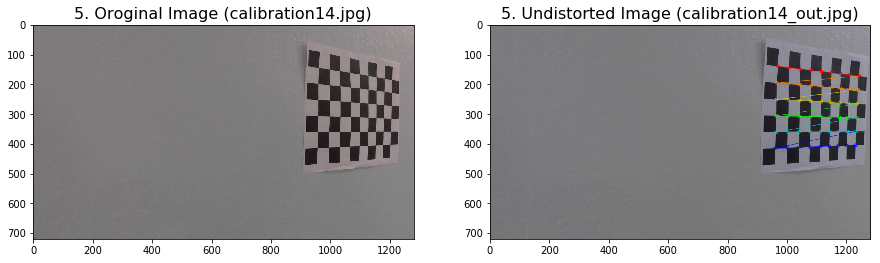

...

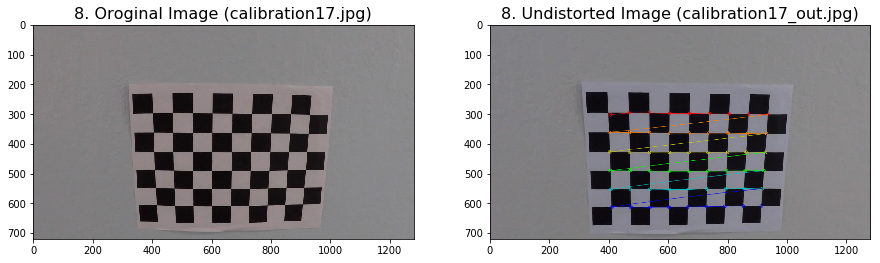

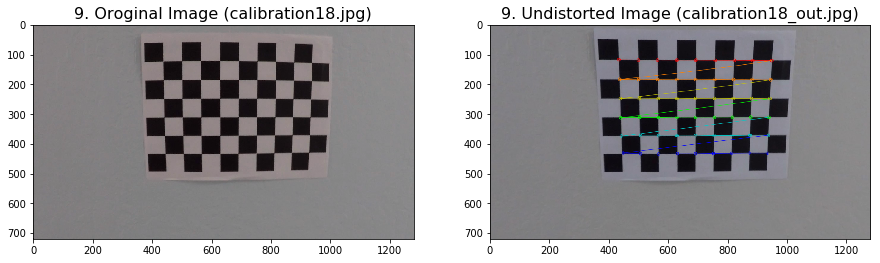

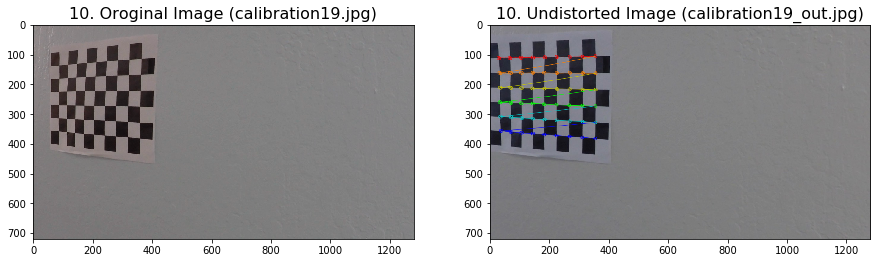

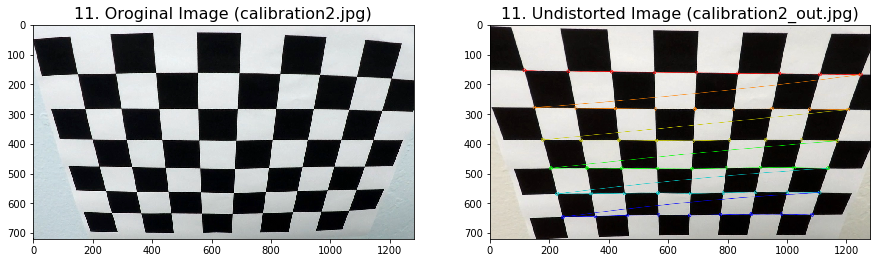

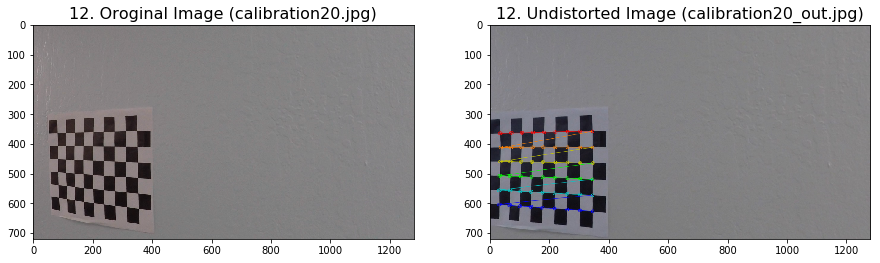

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


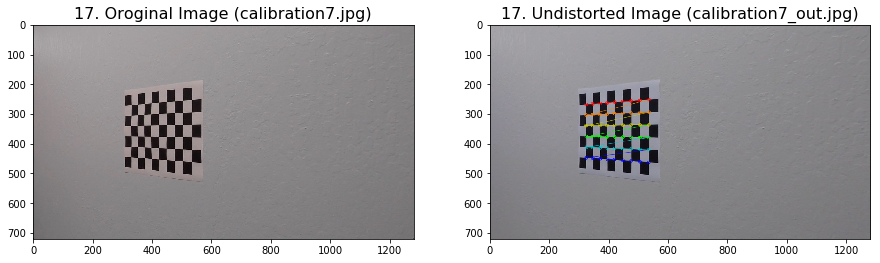

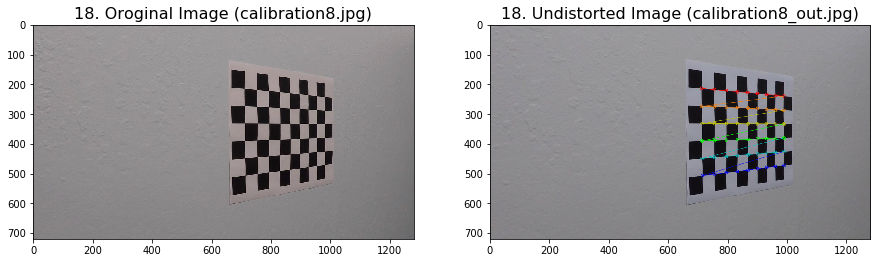

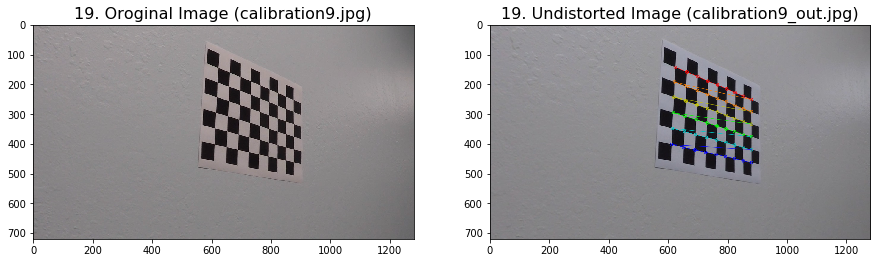

In [4]:
# o/p folder creation for Chess 'camera_cal' dir i/p images
chess_distortion_correction_folder = 'output_images/camera_cal_Output'
if not os.path.exists(chess_distortion_correction_folder):
    os.makedirs(chess_distortion_correction_folder)

chess_rows = 6
chess_columns = 9
channels= 3
calibration_images = 'camera_cal\calibration*.jpg'

objp = np.zeros((chess_rows * chess_columns,channels), np.float32)
objp[:,:2] = np.mgrid[0:chess_columns, 0:chess_rows].T.reshape(-1,2)

objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

calibration_images_list = glob.glob(calibration_images)

for i, cal_image in enumerate(calibration_images_list):
    image_name = cal_image.split('\\', 1 )[1]
    image_name = image_name.split('.', 1 )[0]
    
    img = cv2.imread(cal_image)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Detect chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If detected, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        cv2.drawChessboardCorners(img, (chess_columns,chess_rows), corners, ret)
        image_size = (img.shape[1], img.shape[0])
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, image_size, None, None)
        undist = cv2.undistort(img, mtx, dist, None, mtx)

        # Display the corners
        f, (axis1, axis2) = plt.subplots(1, 2, figsize=(15,10))
        axis1.imshow(cv2.cvtColor(mplimg.imread(cal_image), cv2.COLOR_BGR2RGB))
        axis1.set_title(str(i)+'. Oroginal Image ('+image_name+'.jpg)', fontsize=16)
        axis2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        axis2.set_title(str(i)+'. Undistorted Image ('+image_name+'_out.jpg)', fontsize=16)
            
        plt.savefig(chess_distortion_correction_folder+"/"+image_name+'_out.jpg')

# B. Undistort the images

* Apply a distortion correction to raw images.
  - i/p : calculated camera calibration matrix and distortion coefficients to remove distortion from an image, and  
  - o/p : the undistorted image.

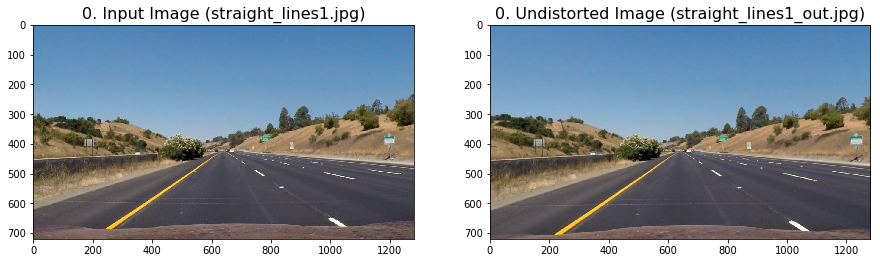

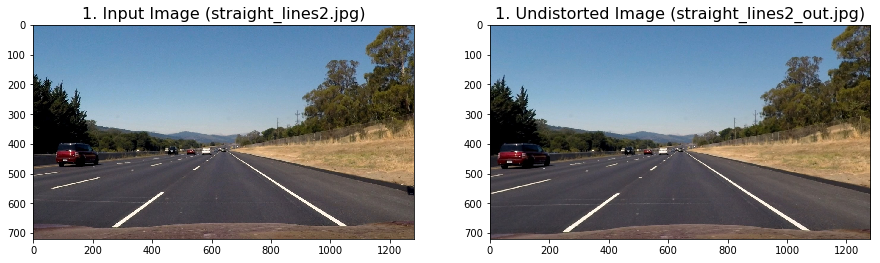

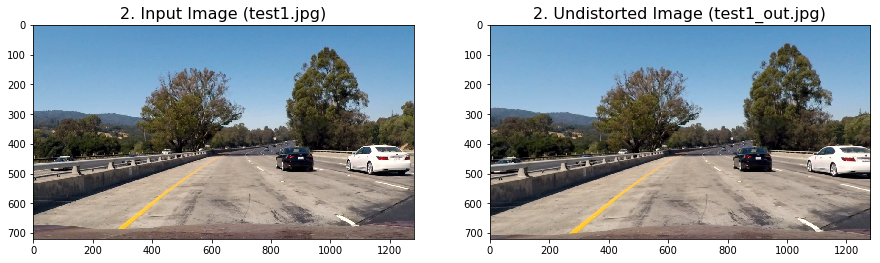

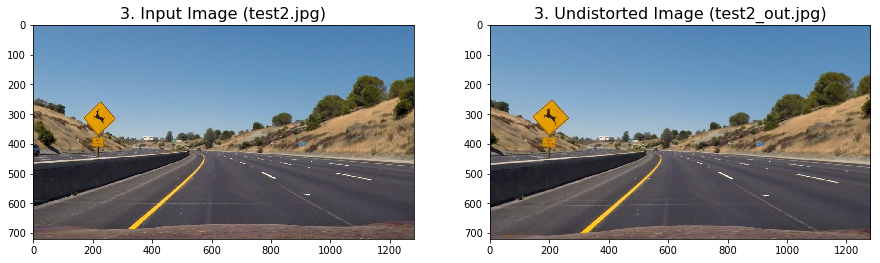

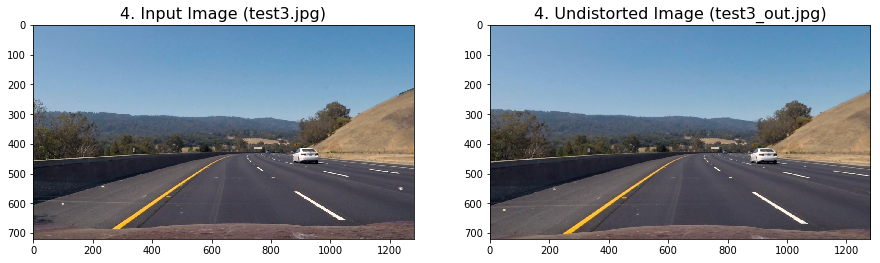

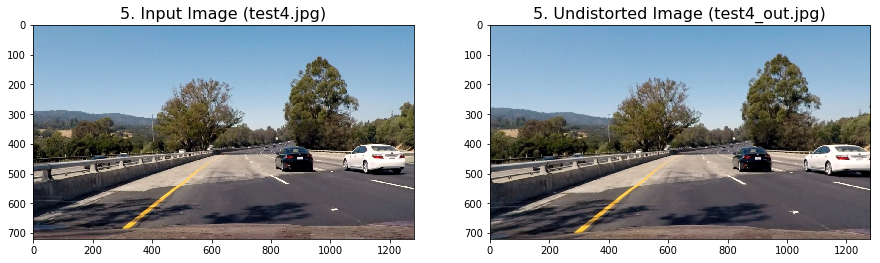

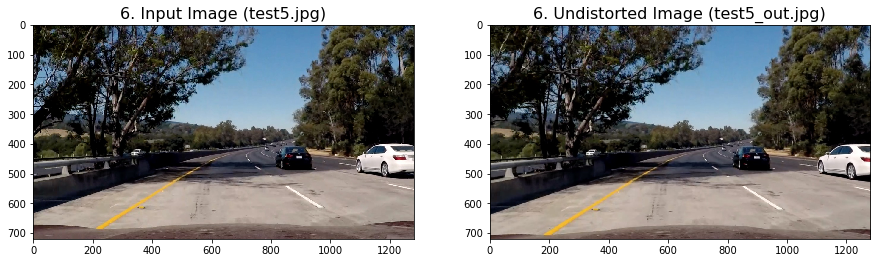

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [5]:
# o/p folder creation for road 'test_images' dir i/p images
road_undistorted_imgs_folder = 'output_images/test_images_Output'
if not os.path.exists(road_undistorted_imgs_folder):
    os.makedirs(road_undistorted_imgs_folder)

# Remove distortion from images
def undistort(idx, img, show=True, read = True):
    image_name = img.split('\\', 1 )[1]
    image_name = image_name.split('.', 1 )[0]
    if read:
        img = cv2.imread(img)
    image_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, image_size, None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    if show:
        f, (axis1, axis2) = plt.subplots(1, 2, figsize=(15,10))
        axis1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axis1.set_title(str(idx)+'. Input Image ('+image_name+'.jpg)', fontsize=16)
        axis2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        axis2.set_title(str(idx)+'. Undistorted Image ('+image_name+'_out.jpg)', fontsize=16)
        plt.savefig(road_undistorted_imgs_folder+"/"+image_name+'_out.jpg')
    else:
        return undist
       
test_images = 'test_images/*.jpg'    
test_images_list = glob.glob(test_images)
for i, image in zip(range(len(test_images_list)), test_images_list):
    undistort(i, image)

# C. Perspective Transform : Bird eye view

* Apply a perspective transform to rectify binary image ("birds-eye view").
  - Transforms the undistorted image to a "birds eye view" with focus on the lane lines. 
  - Displays them so that they appear to be relatively parallel to eachother. 
  
This will make it easier later on to fit polynomials to the lane lines and measure the curvature.

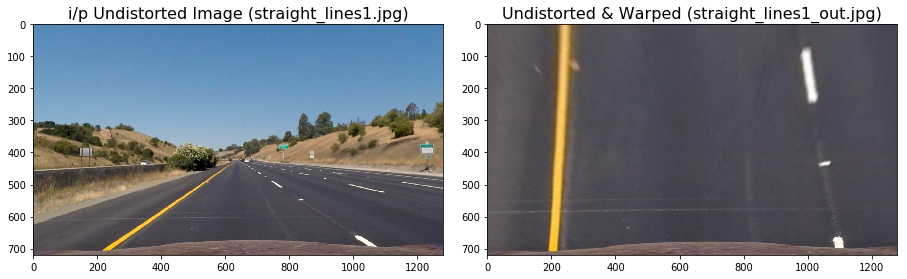

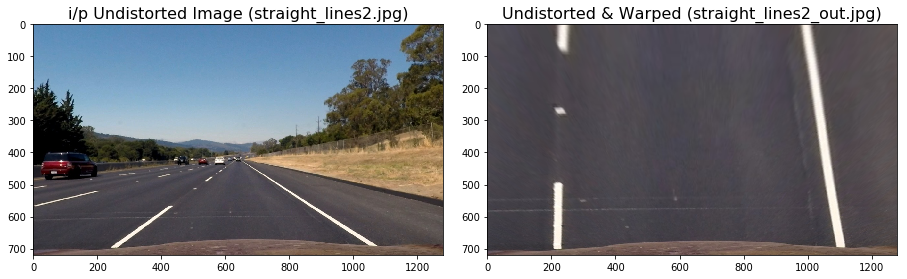

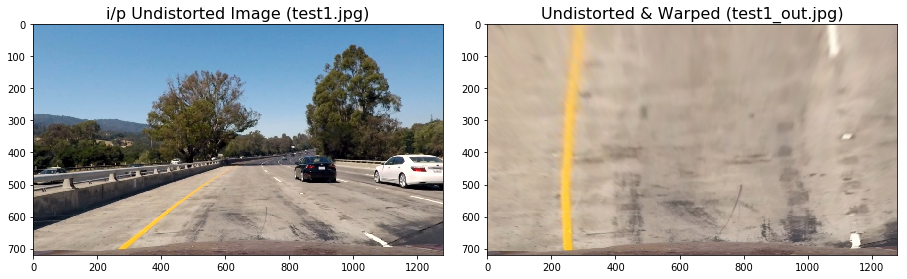

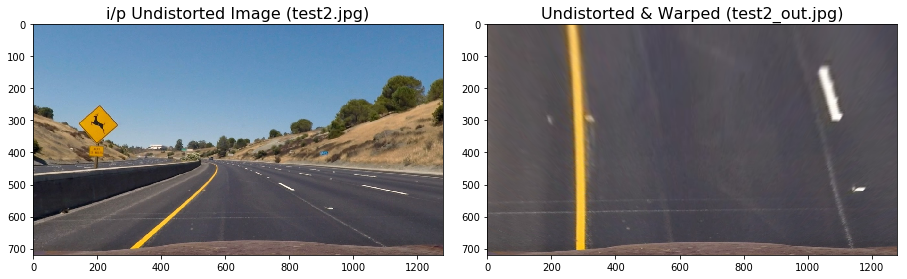

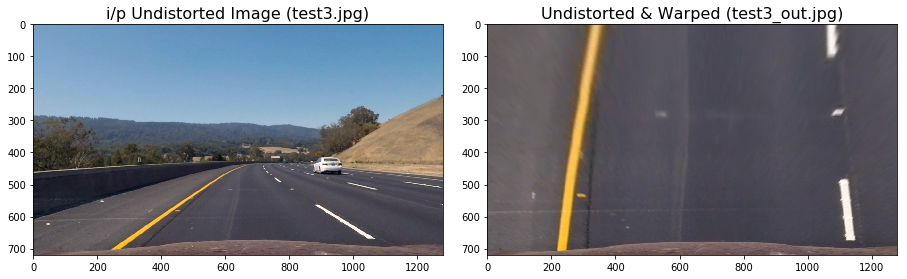

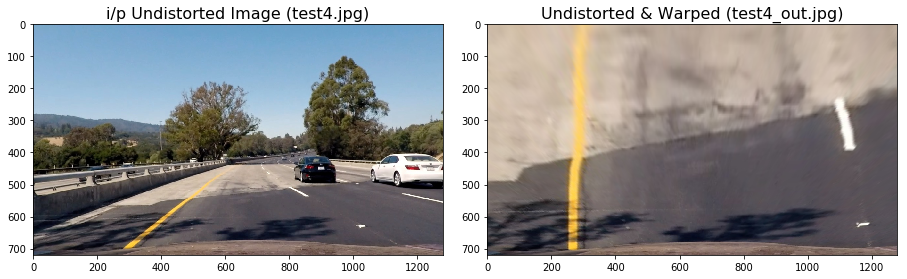

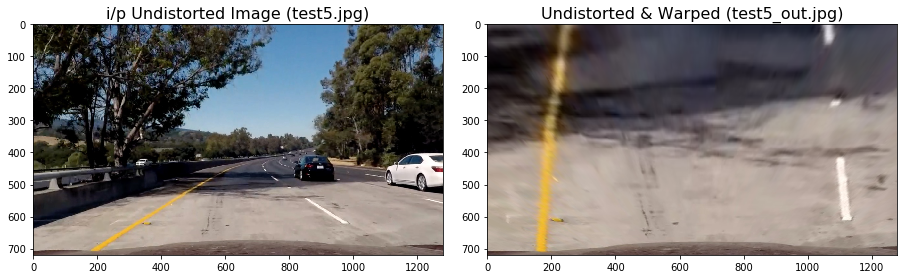

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [6]:
# o/p folder creation for road birds_eye_view
birds_eye_view_imgs_folder = 'output_images/birds_eye_view_Output'
if not os.path.exists(birds_eye_view_imgs_folder):
    os.makedirs(birds_eye_view_imgs_folder)

# Do perspective transform
def warper(idx, image, display=True, read = True):
    image_name = image.split('\\', 1 )[1]
    image_name = image_name.split('.', 1 )[0]
    
    
    if read:
        undist_image = undistort(idx, image, show = False)
    else:
        undist_image = undistort(idx, image, show = False, read = False) 
    image_size = (undist_image.shape[1], undist_image.shape[0])
    
    offset = 0
    source = np.float32([[490, 482],[810, 482],
                      [1250, 720],[40, 720]])
    destination = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    M = cv2.getPerspectiveTransform(source, destination)
    warped = cv2.warpPerspective(undist_image, M, image_size)
    if display:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 7))
        f.tight_layout()
        ax1.imshow(cv2.cvtColor(undist_image, cv2.COLOR_BGR2RGB))
        ax1.set_title('i/p Undistorted Image ('+image_name+'.jpg)', fontsize=16)
        ax2.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
        ax2.set_title('Undistorted & Warped ('+image_name+'_out.jpg)', fontsize=16)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        plt.savefig(birds_eye_view_imgs_folder+"/"+image_name+'_out.jpg')
    else:
        return warped, M

for image in glob.glob(test_images):
    warper(0, image)

## D. Apply Binary Thresholds

* Use color transforms, gradients, etc., to create a thresholded binary image.
  - Convert the warped image to different color spaces and creates binary thresholded images which highlight only lane lines and ignore everything else
  - Following colour channels were used:
    - 'S' Channel from HLS color space, with a minimum threshold = 180 & max threshold = 255
       - Good: Identifies the white and yellow lane lines, 
       - Bad: Did not pick up 100% of the pixels in either one with the tendency to get distracted by shadows on the road.
    - 'L' Channel from LUV color space, with a min threshold = 225 & max threshold = 255, 
       - Good: Picks up almost all the white lane lines, but 
       - Bad: completely ignores the yellow lines.
    - 'B' channel from the LAB color space, with a min threshold = 155 & max threshold = 200, 
       - Good : Identifies the yellow lines much better than S channel, but 
       - BAd: Completely ignores the white lines.
       
   - Ceated a combined binary threshold based on the above three mentioned binary thresholds.

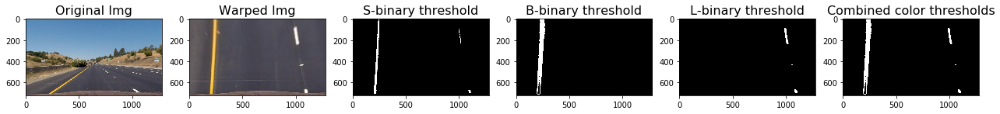

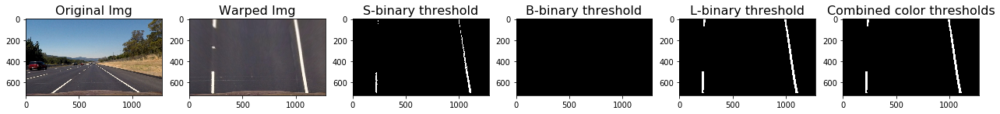

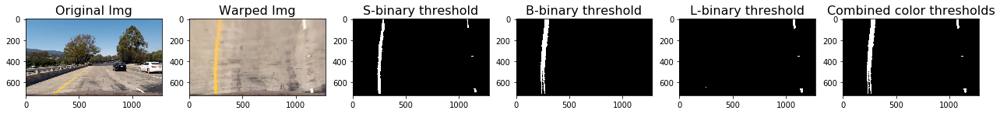

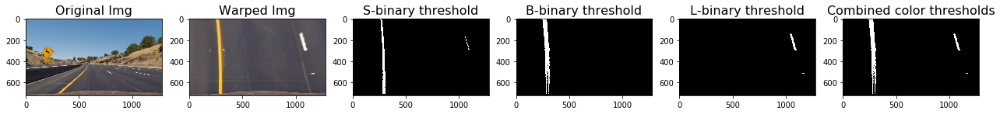

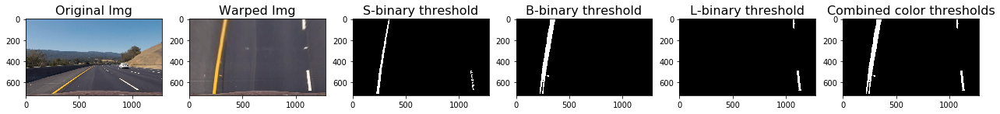

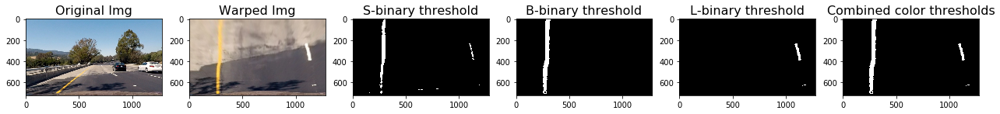

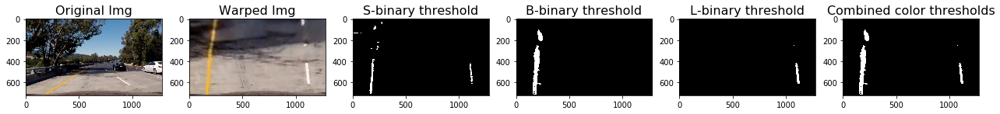

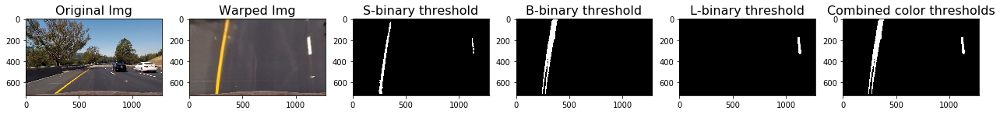

In [7]:
# o/p folder creation for binary_thresholds
binary_thresholds_imgs_folder = 'output_images/binary_thresholds_Output'
if not os.path.exists(binary_thresholds_imgs_folder):
    os.makedirs(binary_thresholds_imgs_folder)

# Create binary thresholded images to isolate lane line pixels
def apply_binary_thresholds(idx, image, show=True):
    image_name = image.split('\\', 1 )[1]
    image_name = image_name.split('.', 1 )[0]
    
    img, M = warper(idx, image, display = False)

    s_channel_of_hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[:,:,2]
    l_channel_of_luv = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)[:,:,0]
    b_channel_of_bgr = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)[:,:,2]   

    # Defining threshold of the color channels used
    s_threshold_min = 180
    s_threshold_max = 255
    s_binary = np.zeros_like(s_channel_of_hls)
    s_binary[(s_channel_of_hls >= s_threshold_min) & (s_channel_of_hls <= s_threshold_max)] = 1
    
    l_threshold_min = 225
    l_threshold_max = 255
    l_binary = np.zeros_like(l_channel_of_luv)
    l_binary[(l_channel_of_luv >= l_threshold_min) & (l_channel_of_luv <= l_threshold_max)] = 1

    b_threshold_min = 155
    b_threshold_max = 200
    b_binary = np.zeros_like(b_channel_of_bgr)
    b_binary[(b_channel_of_bgr >= b_threshold_min) & (b_channel_of_bgr <= b_threshold_max)] = 1
    
    
    
    combined_binary = np.zeros_like(s_binary)
    combined_binary[(l_binary == 1) | (b_binary == 1)] = 1

    if show == True:
        # Plotting thresholded images
        f, (ax1, ax2, ax3, ax4,ax5, ax6) = plt.subplots(1, 6, figsize=(17,13))
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        
        ax1.set_title('Original Img', fontsize=16)
        ax1.imshow(cv2.cvtColor(undistort(idx, image, show=False),cv2.COLOR_BGR2RGB))
        
        ax2.set_title('Warped Img', fontsize=16)
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype('uint8'))
        
        ax3.set_title('S-binary threshold', fontsize=16)
        ax3.imshow(s_binary, cmap='gray')
        
        ax4.set_title('B-binary threshold', fontsize=16)
        ax4.imshow(b_binary, cmap='gray')
        
        ax5.set_title('L-binary threshold', fontsize=16)
        ax5.imshow(l_binary, cmap='gray')

        ax6.set_title('Combined color thresholds', fontsize=16)
        ax6.imshow(combined_binary, cmap='gray')
        
        plt.savefig(binary_thresholds_imgs_folder+"/"+image_name+'_out.jpg')
    else: 
        return combined_binary

    
    
for image in glob.glob(test_images):
    i = 0
    apply_binary_thresholds(i, image)
    i = i+1

# E, F, G : Fitting a polynomial to the lane lines, calculating vehicle position and radius of curvature.

- Detect lane pixels and fit to find the lane boundary.
- Determine the curvature of the lane and vehicle position with respect to center.
- Warp the detected lane boundaries back onto the original image.

-----------------------------------

- Used combined binary image to isolate lane line pixels and fit a polynomial to each of the lane lines. 
- Space in between the identified lane lines is filled in to highlight the driveable area in the lane. 
- Position of the vehicle is measured by taking the avg. of the x intercepts of each line.
- Lane lines are detected by detecting peaks in a image histogram and detecting nonzero pixels in close proximity to the peaks.

In [8]:
# o/p folder creation for color_lanes
color_lanes_imgs_folder = 'output_images/color_lanes_Output'
if not os.path.exists(color_lanes_imgs_folder):
    os.makedirs(color_lanes_imgs_folder)

def color_lane(idx, image):
    NINTY = 90
    
    image_name = image.split('\\', 1 )[1]
    image_name = image_name.split('.', 1 )[0]
    collated_binary_image = apply_binary_thresholds(idx, image, show=False)
    
    right_x = []
    left_x = []
    
    left_y = []
    right_y = []
        
    x, y = np.nonzero(np.transpose(collated_binary_image))
    
    i = 720
    j = 630
    
    while j >= 0:
        histogram_bars = np.sum(collated_binary_image[j:i,:], axis=0)
        
        # Calculations for left peak
        left_peak = np.argmax(histogram_bars[:640])
        x_index = np.where((((left_peak - 25) < x)&(x < (left_peak + 25))&((y > j) & (y < i))))
        window_x, window_y = x[x_index], y[x_index]
        if np.sum(window_x) != 0:
            left_x.extend(window_x.tolist())
            left_y.extend(window_y.tolist())

        # Calculations for right peak    
        right_peak = np.argmax(histogram_bars[640:]) + 640
        x_index = np.where((((right_peak - 25) < x)&(x < (right_peak + 25))&((y > j) & (y < i))))
        window_x, window_y = x[x_index], y[x_index]
        if np.sum(window_x) != 0:
            right_x.extend(window_x.tolist())
            right_y.extend(window_y.tolist())
        i -= NINTY
        j -= NINTY

    left_y = np.array(left_y).astype(np.float32)
    left_x = np.array(left_x).astype(np.float32)
    
    right_y = np.array(right_y).astype(np.float32)
    right_x = np.array(right_x).astype(np.float32)
    
    left_lane_fit = np.polyfit(left_y, left_x, 2)
    left_lane_fitx = left_lane_fit[0]*left_y**2 + left_lane_fit[1]*left_y + left_lane_fit[2]
    
    right_lane_fit = np.polyfit(right_y, right_x, 2)
    right_lane_fitx = right_lane_fit[0]*right_y**2 + right_lane_fit[1]*right_y + right_lane_fit[2]
    
    right_x_int = right_lane_fit[0]*720**2 + right_lane_fit[1]*720 + right_lane_fit[2]
    right_x = np.append(right_x,right_x_int)
    right_y = np.append(right_y, 720)
    
    right_x = np.append(right_x, right_lane_fit[0]*0**2 + right_lane_fit[1]*0 + right_lane_fit[2])
    right_y = np.append(right_y, 0)
    
    left_x_int = left_lane_fit[0]*720**2 + left_lane_fit[1]*720 + left_lane_fit[2]
    left_x = np.append(left_x, left_x_int)
    left_y = np.append(left_y, 720)
    
    left_x = np.append(left_x, left_lane_fit[0]*0**2 + left_lane_fit[1]*0 + left_lane_fit[2])
    left_y = np.append(left_y, 0)
    
    lsort = np.argsort(left_y)
    rsort = np.argsort(right_y)
    
    left_y = left_y[lsort]
    left_x = left_x[lsort]
    
    right_y = right_y[rsort]
    right_x = right_x[rsort]
    
    left_lane_fit = np.polyfit(left_y, left_x, 2)
    left_lane_fitx = left_lane_fit[0]*left_y**2 + left_lane_fit[1]*left_y + left_lane_fit[2]
    right_lane_fit = np.polyfit(right_y, right_x, 2)
    right_lane_fitx = right_lane_fit[0]*right_y**2 + right_lane_fit[1]*right_y + right_lane_fit[2]
    
    # Find radius of curvature for both lane line
    xm_per_pix = 3.7/700 # meteres/pixel in x dimension
    ym_per_pix = 30.0/720 # meters/pixel in y dimension
   
    left_lane_fit_curvature = np.polyfit(left_y*ym_per_pix, left_x*xm_per_pix, 2)
    right_lane_fit_curvature = np.polyfit(right_y*ym_per_pix, right_x*xm_per_pix, 2)
    radius_left_curve = ((1 + (2*left_lane_fit_curvature[0]*np.max(left_y) + left_lane_fit_curvature[1])**2)**1.5) \
                                /np.absolute(2*left_lane_fit_curvature[0])
    radius_right_curve = ((1 + (2*right_lane_fit_curvature[0]*np.max(left_y) + right_lane_fit_curvature[1])**2)**1.5) \
                                /np.absolute(2*right_lane_fit_curvature[0])
    
    
    # Find position of the vehicle
    vehicles_center = abs(640 - ((right_x_int+left_x_int)/2))
    
    # offset = 0 
    img_size = (img.shape[1], img.shape[0])
    source = np.float32([[490, 482],[810, 482],[1250, 720],[40, 720]])
    destination = np.float32([[0, 0], [1280, 0],[1250, 720],[40, 720]])
    Minv = cv2.getPerspectiveTransform(destination, source)
    
    warp_zero = np.zeros_like(collated_binary_image).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_lane_fitx, left_y])))])
    pts_right = np.array([np.transpose(np.vstack([right_lane_fitx, right_y]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0, 0, 255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    new_warp = cv2.warpPerspective(color_warp, Minv, (collated_binary_image.shape[1], collated_binary_image.shape[0]))
    result = cv2.addWeighted(mplimg.imread(image), 1, new_warp, 0.5, 0)
    
    f, (axis1, axis2) = plt.subplots(1,2, figsize=(15, 11))
    axis1.imshow(cv2.cvtColor((warper(idx, image, display=False)[0]), cv2.COLOR_BGR2RGB))
    axis1.set_xlim(0, 1280)
    axis1.set_ylim(0, 768)
    axis1.plot(left_lane_fitx, left_y, color='green', linewidth=3)
    axis1.plot(right_lane_fitx, right_y, color='green', linewidth=3)
    axis1.set_title('Polynomial fit to Lane Lines', fontsize=16)
    axis1.invert_yaxis() # to visualize as we do the images
    axis2.imshow(result)
    axis2.set_title('Color Lane Between Polynomials', fontsize=16)
    if vehicles_center < 640:
        axis2.text(230, 50, 'Vehicle is left of center by : {:.2f}m'.format(vehicles_center*3.7/700),
                 style='italic', color='white', fontsize=14)
    else:
        axis2.text(230, 50, 'Vehicle is right of center by : {:.2f}m'.format(vehicles_center*3.7/700),
                 style='normal', color='white', fontsize=14)
    axis2.text(230, 125, 'Lane curvature radius is : {}m'.format(int((radius_left_curve + radius_right_curve)/2)),
             style='normal', color='white', fontsize=14)
    plt.savefig(color_lanes_imgs_folder+"/"+image_name+'_out.jpg')

## H. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

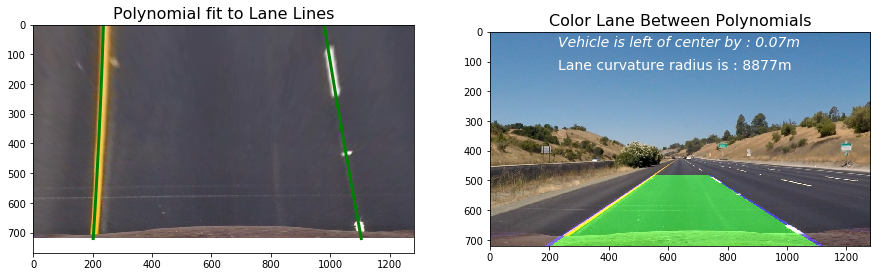

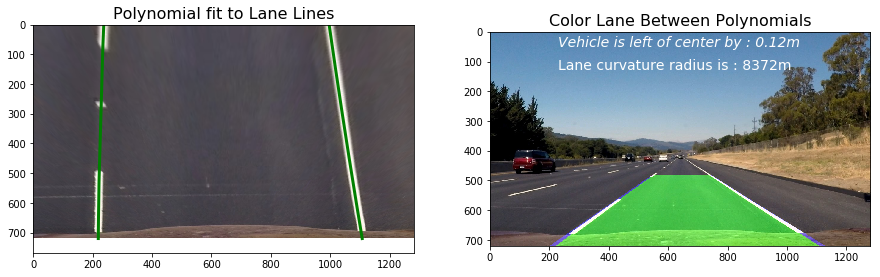

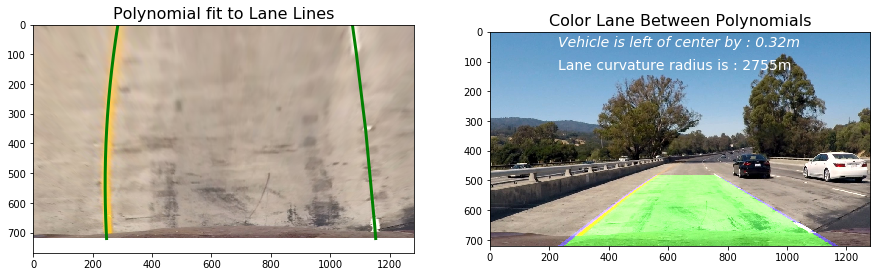

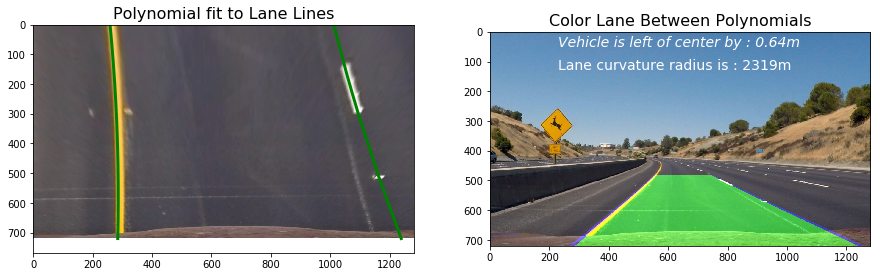

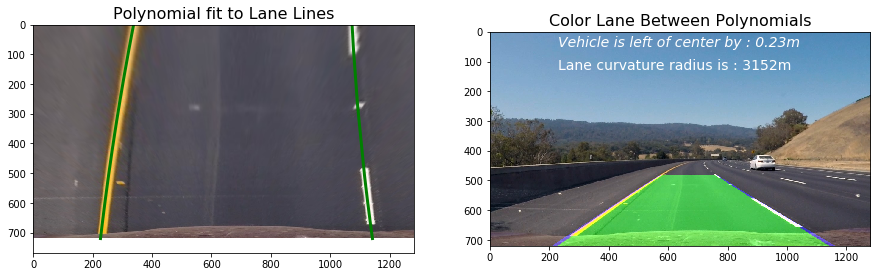

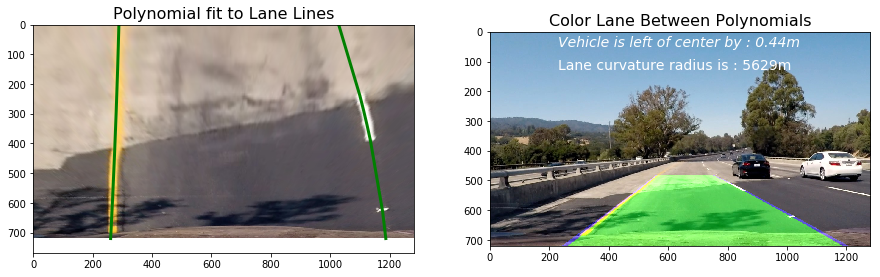

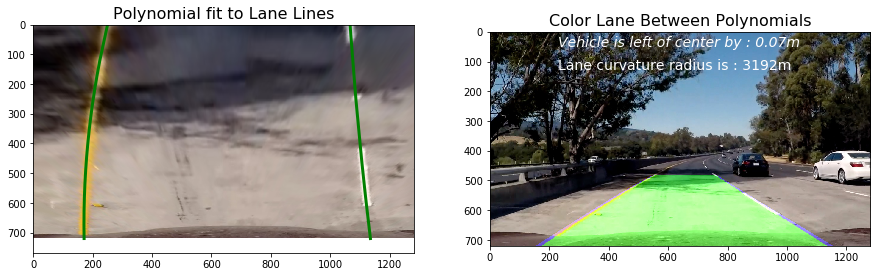

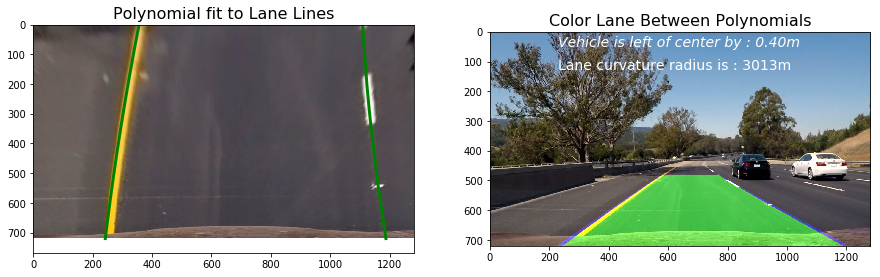

In [9]:
for image in glob.glob(test_images):
    color_lane(0, image)

## I. Video Processing Pipeline:
- Class to store Lane Line attributes from one frame to the next, and helper fns. 

In [10]:
"""
Class to store Lane Line attributes from one frame to the next, and helper fns. 
"""
class Line:
    def __init__(self):
        MAX_LEN = 10
        # Is the line found in the previous frame
        self.found = False
        
        # Memorize last x intercept to compare against current one
        self.lastx_int = None
        self.last_top = None
        
        # Memorize radius of curvature
        self.radius = None
        
        # Store recent polynomial coefficients for averaging across frames
        self.fit0 = deque(maxlen=MAX_LEN)
        self.fit1 = deque(maxlen=MAX_LEN)
        self.fit2 = deque(maxlen=MAX_LEN)
        
        self.fitx = None
        self.pts = []
        
        # Memorize x and y values of lanes in previous frame
        self.X = None
        self.Y = None
        
        # Keep recent 'x' intercepts avg. across frames
        self.x_int = deque(maxlen=10)
        self.top = deque(maxlen=10)
           
        # Count of number of frames
        self.count = 0
        
    """
    Applied when we have detected lane lines in the previous frame. Uses a sliding window to search 
    for lane pixels in close proximity (+/- 25 pixels in the x direction) around the previous 
    detected polynomial. 
    """
    def targeted_search(self, x, y):
        x_vals = []
        y_vals = []
        if self.found == True: 
            i = 720
            j = 630
            while j >= 0:
                y_val = np.mean([i,j])
                x_val = (np.mean(self.fit0))*y_val**2 + (np.mean(self.fit1))*y_val + (np.mean(self.fit2))
                x_idx = np.where((((x_val - 25) < x)&(x < (x_val + 25))&((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                if np.sum(x_window) != 0:
                    np.append(x_vals, x_window)
                    np.append(y_vals, y_window)
                i -= 90
                j -= 90
        if np.sum(x_vals) == 0: 
            self.found = False
        return x_vals, y_vals, self.found
    
    """
    (1). Applied in the first few frames and/or 
    (2). If the lane was not successfully detected in the previous frame. 
    
    Uses a slinding window approach to detect peaks in a histogram of the binary thresholded image. 
    Pixels in close proimity to the detected peaks are considered belonging to the lane lines.
    """
    def random_search(self, x, y, image):
        x_vals = []
        y_vals = []
        if self.found == False: 
            i = 720
            j = 630
            while j >= 0:
                histogram = np.sum(image[j:i,:], axis=0)
                if self == Right:
                    peak = np.argmax(histogram[640:]) + 640
                else:
                    peak = np.argmax(histogram[:640])
                x_idx = np.where((((peak - 25) < x)&(x < (peak + 25))&((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                if np.sum(x_window) != 0:
                    x_vals.extend(x_window)
                    y_vals.extend(y_window)
                i -= 90
                j -= 90
        if np.sum(x_vals) > 0:
            self.found = True
        else:
            y_vals = self.Y
            x_vals = self.X
        return x_vals, y_vals, self.found
    
    def find_intercepts(self, polynomial):
        bottom = polynomial[0]*720**2 + polynomial[1]*720 + polynomial[2]
        top = polynomial[0]*0**2 + polynomial[1]*0 + polynomial[2]
        return bottom, top
    
    def calculate_radius_of_curvature(self, x_vals, y_vals):
        ym_per_pix = 30./720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meteres per pixel in x dimension
        fit_cr = np.polyfit(y_vals*ym_per_pix, x_vals*xm_per_pix, 2)
        curverad = ((1 + (2*fit_cr[0]*np.max(y_vals) + fit_cr[1])**2)**1.5) \
                                     /np.absolute(2*fit_cr[0])
        return curverad
    
    def sort_values(self, x_vals, y_vals):
        sorted_index = np.argsort(y_vals)
        sorted_y_vals = y_vals[sorted_index]
        sorted_x_vals = x_vals[sorted_index]
        return sorted_x_vals, sorted_y_vals    

- Function process_video() to processes a video frame by frame and outputs video with 'lane lines, radius of curvature and distance from center' annotations.
- Similar to the color_lanes() function written above, except that it stores information about the lane lines across frames in order to average the lane positions to ensure a smooth output which is less impacted by outliers.
- Also knows whether the lane line was detected in the previous frame. 
  - If yes, it only checks for lane pixels in a tight window around the previous polynomial in order to have a high confidence detection. 
  - If not, (and for the first 5 frames of the video), the pipeline performs the same search which was performed in the color_lanes() function based on identifying peaks in a histogram.

In [11]:
# Pipeline for Video Processing
def process_video(image):
    image_size = (image.shape[1], image.shape[0])
    
    # Calibrate camera and undistort image
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, image_size, None, None)
    undistorted_image = cv2.undistort(image, mtx, dist, None, mtx)
    
    # Do the perspective transform
    source = np.float32([[490, 482],[810, 482],
                      [1250, 720],[0, 720]])
    destination = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    M = cv2.getPerspectiveTransform(source, destination)
    warped_image = cv2.warpPerspective(undistorted_image, M, image_size)
    
    # Get binary thresholded images
    b_channel_of_lab = cv2.cvtColor(warped_image, cv2.COLOR_RGB2Lab)[:,:,2]
    l_channel_of_luv = cv2.cvtColor(warped_image, cv2.COLOR_RGB2LUV)[:,:,0]  
    
    # Fix the upper & lower thresholds for the b-channel
    b_threshold_min = 145
    b_threshold_max = 200
    b_binary_img = np.zeros_like(b_channel_of_lab)
    b_binary_img[(b_channel_of_lab >= b_threshold_min) & (b_channel_of_lab <= b_threshold_max)] = 1
    
    # Fix the upper & lower thresholds for the l-channel
    l_threshold_min = 215
    l_threshold_max = 255
    l_binary_img = np.zeros_like(l_channel_of_luv)
    l_binary_img[(l_channel_of_luv >= l_threshold_min) & (l_channel_of_luv <= l_threshold_max)] = 1

    combined_binary_img = np.zeros_like(b_binary_img)
    combined_binary_img[(l_binary_img == 1) | (b_binary_img == 1)] = 1
    
    # Detect the non-zero pixels in the image
    x, y = np.nonzero(np.transpose(combined_binary_img)) 

    if Left.found == True: # Find the left lane pixels around previous polynomial
        left_x, left_y, Left.found = Left.targeted_search(x, y)
        
    if Right.found == True: # S Find the right lane pixels around previous polynomial
        right_x, right_y, Right.found = Right.targeted_search(x, y)

            
    if Right.found == False: # Perform blind search for right lane lines
        right_x, right_y, Right.found = Right.random_search(x, y, combined_binary_img)
            
    if Left.found == False:# Perform blind search for left lane lines
        left_x, left_y, Left.found = Left.random_search(x, y, combined_binary_img)

    left_y = np.array(left_y).astype(np.float32)
    left_x = np.array(left_x).astype(np.float32)
    right_y = np.array(right_y).astype(np.float32)
    right_x = np.array(right_x).astype(np.float32)
            
    # Find left polynomial fit based on detected pixels
    left_fit = np.polyfit(left_y, left_x, 2)
    
    # Find intercepts to extend the polynomial to the top and bottom of warped image
    left_x_int, left_top = Left.find_intercepts(left_fit)
    
    # Average intercepts across 'n' frames
    Left.x_int.append(left_x_int)
    Left.top.append(left_top)
    left_x_int = np.mean(Left.x_int)
    left_top = np.mean(Left.top)
    Left.lastx_int = left_x_int
    Left.last_top = left_top
    
    # Add averaged intercepts to current x and y vals
    left_x = np.append(left_x, left_x_int)
    left_y = np.append(left_y, 720)
    left_x = np.append(left_x, left_top)
    left_y = np.append(left_y, 0)
    
    # Sort the detected pixels based on the y-vals
    left_x, left_y = Left.sort_values(left_x, left_y)
    
    Left.X = left_x
    Left.Y = left_y
    
    # Re-calculate polynomial with intercepts and average across 'n' frames
    left_fit = np.polyfit(left_y, left_x, 2)
    Left.fit0.append(left_fit[0])
    Left.fit1.append(left_fit[1])
    Left.fit2.append(left_fit[2])
    left_fit = [np.mean(Left.fit0), np.mean(Left.fit1), np.mean(Left.fit2)]
    
    # Fit polynomial to detected pixels
    left_fit_x = left_fit[0]*left_y**2 + left_fit[1]*left_y + left_fit[2]
    Left.fitx = left_fit_x
    
    # Find right polynomial fit based on detected pixels
    right_fit = np.polyfit(right_y, right_x, 2)

    # Find intercepts to extend the polynomial to the top and bottom of warped image
    right_x_int, right_top = Right.find_intercepts(right_fit)
    
    # Avg. the intercepts across 5 frames
    Right.x_int.append(right_x_int)
    right_x_int = np.mean(Right.x_int)
    Right.top.append(right_top)
    right_top = np.mean(Right.top)
    Right.lastx_int = right_x_int
    Right.last_top = right_top
    right_x = np.append(right_x, right_x_int)
    right_y = np.append(right_y, 720)
    right_x = np.append(right_x, right_top)
    right_y = np.append(right_y, 0)
    
    # Sort right lane pixels
    right_x, right_y = Right.sort_values(right_x, right_y)
    Right.X = right_x
    Right.Y = right_y
    
    # Re-calculate polynomial with intercepts and average across 'n' frames
    right_fit = np.polyfit(right_y, right_x, 2)
    Right.fit0.append(right_fit[0])
    Right.fit1.append(right_fit[1])
    Right.fit2.append(right_fit[2])
    right_fit = [np.mean(Right.fit0), np.mean(Right.fit1), np.mean(Right.fit2)]
    
    # Fit polynomial to detected pixels
    right_fitx = right_fit[0]*right_y**2 + right_fit[1]*right_y + right_fit[2]
    Right.fitx = right_fitx
        
    # Calculate radius of curvature for each lane (in meters)
    radius_left_curve = Left.calculate_radius_of_curvature(left_x, left_y)
    radius_right_curve = Right.calculate_radius_of_curvature(right_x, right_y)
        
    # Print the radius of curvature every 3 frames for improved readability
    if Left.count % 3 == 0:
        Left.radius = radius_left_curve
        Right.radius = radius_right_curve
        
    # Calculate the vehicle position relative to the center of the lane
    position = (right_x_int + left_x_int)/2
    distance_from_center = abs((640 - position)*3.7/700) 
                
    Minv = cv2.getPerspectiveTransform(destination, source)
    
    warped_zero = np.zeros_like(combined_binary_img).astype(np.uint8)
    color_warped = np.dstack((warped_zero, warped_zero, warped_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([Left.fitx, Left.Y])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, Right.Y]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warped, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warped, np.int_(pts), (34,255,34))
    new_warped = cv2.warpPerspective(color_warped, Minv, (image.shape[1], image.shape[0]))
    result = cv2.addWeighted(undistorted_image, 1, new_warped, 0.5, 0)
        
    # Display distance from center on the created video
    if position > 640:
        cv2.putText(result, 'Vehicle is left of center by : {:.2f}m'.format(distance_from_center), (100,80),
                 fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    else:
        cv2.putText(result, 'Vehicle is right of center by : {:.2f}m'.format(distance_from_center), (100,80),
                 fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    # Print radius of curvature on video
    cv2.putText(result, 'Lane curvature radius is : {}m'.format(int((Left.radius+Right.radius)/2)), (120,140),
             fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    Left.count += 1
    return result

## I1. Running for 'project_video.mp4'

In [12]:
# o/p folder creation for Chess 'camera_cal' dir i/p images
output_videos_folder = 'output_videos'
if not os.path.exists(output_videos_folder):
    os.makedirs(output_videos_folder)
    
import time

Left = Line()
Right = Line()
video_output = output_videos_folder+'/project_video_ouput.mp4'
clip1 = VideoFileClip("project_video.mp4")

white_clip = clip1.fl_image(process_video) 
white_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video output_videos/project_video_ouput.mp4
[MoviePy] Writing video output_videos/project_video_ouput.mp4


100%|█████████▉| 1260/1261 [18:34<00:00,  1.12it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/project_video_ouput.mp4 



In [13]:
from IPython.display import HTML
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('result.mp4'))

In [14]:
## I2. Running for 'challenge_video.mp4'

Left = Line()
Right = Line()
challenge_output = output_videos_folder+'/challenge_video_ouput.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
challenge_clip = clip1.fl_image(process_video) 
challenge_clip.write_videofile(challenge_output, audio=False)

[MoviePy] >>>> Building video output_videos/challenge_video_ouput.mp4
[MoviePy] Writing video output_videos/challenge_video_ouput.mp4


100%|██████████| 485/485 [06:56<00:00,  1.16it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/challenge_video_ouput.mp4 



Next is the result of the pipeline on a harder challenge video


In [15]:
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('challenge_result.mp4'))

In [16]:
Left = Line()
Right = Line()
challenge_output = output_videos_folder+'/harder_challenge_output.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")
challenge_clip = clip1.fl_image(process_video) 
challenge_clip.write_videofile(challenge_output, audio=False)

[MoviePy] >>>> Building video output_videos/harder_challenge_output.mp4
[MoviePy] Writing video output_videos/harder_challenge_output.mp4


100%|█████████▉| 1199/1200 [18:21<00:00,  1.09it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/harder_challenge_output.mp4 



In [17]:
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('harder_challenge_result.mp4'))